<img align="right" src="https://github.com/codeBMB/April26_Rutgers-RCSB/raw/main/images/PyBMB_logo.png" width="150" height="150" />

<!-- # Project:  -->
## Amino Acids, Peptides, Conformational Analysis, and Ramachandran Plot

**Purpose:**

This notebook introduces the structure and conformational behavior of amino acids and peptides using computational chemistry tools. First, it will examine individual amino acids, then build short peptide sequences, generate 2-D and 3-D molecular models, identify peptide backbone atoms, and explore how rotation about backbone bonds changes molecular shape and energy.

Special attention is given to the peptide backbone dihedral angles phi (φ) and psi (ψ). Students will use interactive molecular visualizations, conformational energy calculations, steric-clash maps, and ramachandran plots to connect molecular geometry with peptide stability and secondary structures.

By the end, students should be able to relate familiar structureal concepts such as amino acid sequence, peptide bonds, steric interactions, and secondary structure to quantitative computational models.


**Input Data:**

* **Amino Acids**: Defined internally using smiles strings and FASTA letters.
* **Peptides**: Defined using FASTA sequences of Amino Acids.
* **Force Field**: MMFF94 (Merck Molecular Force Field), accessed via RDKit.
* **Retrieved On:** N/A — all molecules generated computationally.


**Libraries:**
* `rdkit` — Cheminformatics toolkit for parsing SMILES and FASTA sequences, generating molecular structures, manipulating dihedral angles, and computing
  molecular mechanics energies.
* `py3Dmol` — Browser-based 3D molecular visualization.
* `ipywidgets` — Interactive slider, dropdown menus, and layout widgets for Colab notebooks.
* `matplotlib` — Plotting the conformational energy profile, steric clash accessibility maps, and ramachandran plots.
* `numpy` — Numeric calculations, angle grids, coordinate calculations, and array operations.

**Status with Date:** In development, June - September 2026.

**License:**

<img src="https://github.com/codeBMB/April26_Rutgers-RCSB/raw/main/images/by-nc-sa.png" width="100"/>
CC BY-NC-SA — reusers may distribute, remix, adapt, and build upon
the material for noncommercial purposes only, with attribution,
under identical terms.

---
**Authorship:** Lila Wolfanger

**Acknowledgements:**

**Contact Info:**

---

# 0. Using Google Colab and Runnng Code Cells

This is an interactive notebook. Each **code cell** contains Python code that you run by
clicking the ▶ play button on the left side of the cell, or by pressing **Shift+Enter**.

![run button image](https://github.com/wallynovak/biochemistry_seq_analysis/blob/main/images/run.png?raw=1)

- A spinning circle ◌ means the cell is still running — wait for it to finish.
- A checkmark ✓ and a number like `[1]` in brackets means the cell completed successfully.
- If you see a red error message, re-read it carefully — it usually tells you exactly what went wrong.


## Getting Started

Run the next two cells in order.

When you run the first cell (install packages), Google Colab may automatically restart the runtime after installation. If a pop-up message says that the session crashed or restarted unexpectedly, don't worry. This is expected behavior while the packages are being installed.

After the runtime restarts, continue with the next cell (import libraries).

**Note**: Several later sections depend on variables and structures created in earlier sections. If you restart the runtime, you may need to rerun earlier cells before continuing.

In [ ]:
#@title Cell 0: Install Packages
# ipympl enables interactive matplotlib figures inside Colab widgets.
# rdkit and py3Dmol are the core cheminformatics and visualization tools.

import subprocess, sys

def install_if_missing(package, import_name=None):
    import_name = import_name or package
    try:
        __import__(import_name)
    except ImportError:
        subprocess.check_call([sys.executable, "-m", "pip", "install", package, "-q"])

install_if_missing("ipympl")
install_if_missing("rdkit", "rdkit")
install_if_missing("py3Dmol")

get_ipython().kernel.do_shutdown(restart=True)

# After ipympl installs for the first time, a kernel restart may be required.

{'status': 'ok', 'restart': True}

In [ ]:
#@title Cell 0.1: Import Libraries

import os
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

from rdkit import Chem
from rdkit.Chem import Draw, AllChem, rdMolTransforms
import py3Dmol

try:
    from google.colab import output, drive
    output.enable_custom_widget_manager()
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

print("All libraries imported successfully.")

All libraries imported successfully.


---

# 1. Learning Goals

By the end of this notebook, you will be able to:

1. Identify basic structural features shared by amino acids.
2. Explain how amino acids are connected to form peptides.
3. Distinguish between SMILES and FASTA representations of molecules.
4. Build 2D and 3D molecular models computationally and visualize it interactively.
5. Identify the phi and psi backbone dihedral angles and understand how changing them alters peptide conformation.
6. Interpret a calculated conformational energy surface and identify favorable and unfavorable regions of phi/psi space.
7. Interpret a ramachandran plot.
8. Connect characteristic phi/psi combinations with common secondary structures such as alpha helices and beta sheets.

**Relevant Course Topics:**
Amino acids, peptides, conformational analysis, dihedral angles, steric strain, potential energy, protein secondary structure, and ramachandran plots.


---

# 2. Background

## 2.a Molecules and Conformations

Molecules are not rigid structures. Atoms connected by certain **single bonds** can rotate relative
to one another, allowing the same molecule to adopt different three-dimensional arrangements called **conformations**. The atoms remain connected in the same order, but their positions in space change, meaning that two structures can contain exactly the same atoms and bonds while still having different shapes.

Conformational changes are especially important in peptides and proteins because small rotations along the backbone can produce large changes in overall molecular structure.





<!--

<br>


* molecule like ethane to introduce atoms and bonds
    * ethane visual
* 20 common amino acids / peptides (2 or more amino acids)
    * Alanyl-Glutamine visual w labels for both
* deihedral angles, backbone, phi/psi (3 or more amino acids)
    * each amino acid has a backbone (C' - Ca - N)
    * the backbones are connected, and have a central bond that rotates, need 2 or more for this
    * to have a full phi/psi combo pair, need 3 or more
    * the terminal ends (first and last amino acids) don't have a full phi/psi pair bc it needs part of the previous and preceeding backbone
* energy cost and conformations
    * refer to previous notebook -->


<!-- ## 2a. What is Conformation?

Molecules are not rigid structures. Atoms connected by **single bonds** can rotate relative
to one another, producing different spatial arrangements called **conformations**. Unlike
constitutional isomers (different connectivity) or stereoisomers (different fixed arrangements
in space), conformers are interconvertible at room temperature through bond rotation.

The energy cost of a full 360° rotation around a bond is captured in a **rotational energy
profile** (also called a torsional potential energy surface). Key features:

| Feature | Meaning |
|---|---|
| **Energy minimum** | A stable conformation (molecule "prefers" to be here) |
| **Energy maximum** | An unstable transition state between conformations |
| **Barrier height (ΔE)** | Energy required to rotate through the highest-energy point |
 -->



## 2.b Amino Acids

Amino acids are the building blocks of peptides and proteins. There are 20 common amino acids that all share the same general backbone structure: `N - Cα - C'`

Where:
* **N** is the backbone Nitrogen
* **Cα** is the alpha carbon, which is also attached to a hydrogen and side chain, commonly called the **R group**.
* **C'** is the carbonyl carbon, which is the carbon that's double bonded to an oxygen.


The side chain is what distinguishes one amino acid from another. Without it, all amino acids would be the same. The side chains differ substantially in size, shape, flexibility, polarity, and chemical properties, and they can influence which conformations are favorable for that amino acid or residue.

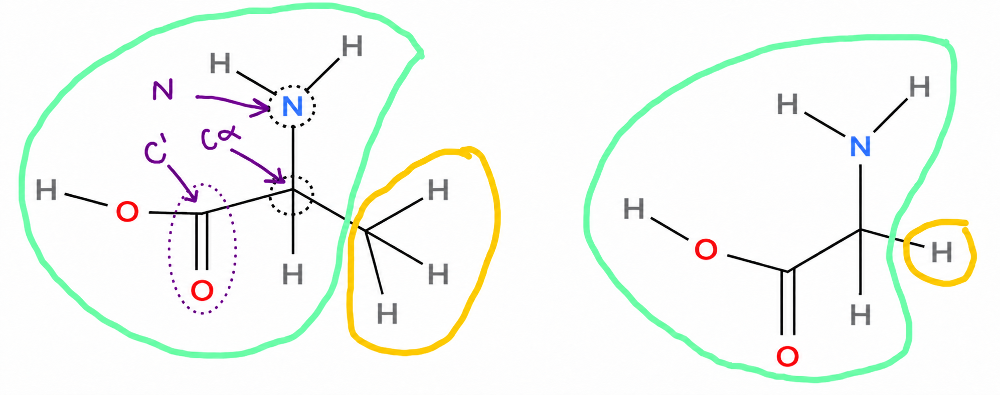

<!-- ^^^ created using molview -->

In the photo above, the atoms circled in green are the backbone atoms and are constant across all amino acids, and the atom(s) circled in orange make up the side chain or R group that make each amino acid unique from one another. On the left is Alanine, and on the right is Glycine. The N - Cα - C' backbone atoms are also labeled. Since Carbon is one of the most common atoms, it's not always explicitly labeled. If there is no element specified after or between two lines, that means a Carbon atom is there.

## 2.c Peptides

Two or more amino acids can be connected to form a **peptide**. The carboxyl group of one amino acid reacts with the amino group of the next amino acid, forming a peptide bond. A peptide containing two amino acids is called a **dipeptide**.

As additional amino acids are added, a repeating backbone develops:

`N - Cα - C' - N - Cα - C' - N - Cα - C'`

The side chains extend outward from the alpha carbons, while the repeating backbone determines much of the overall shape of the peptide.

The following visualization shows Alanyl-Glutamine, a dipeptide containing Alanine followed by Glutamine. The model highlights the backbone atoms used to describe peptide conformation. Run the cell, then use the mouse to rotate the structure and examine how the two amino acids are connected.

In [ ]:
#@title Cell 2.1: Example of a Dipeptide (Alanyl-Glutamine 3D Visualization)

#############################
# HELPER FUNCTIONS
#############################

"""
returns the 3D coordinates of an atom as a NumPy array
"""
def get_atom_position(atom_index):
  p = conf.GetAtomPosition(atom_index)
  return np.array([p.x, p.y, p.z])


"""
draws a rectangular grid through three atoms.

the grid is oriented using the three atom positions
and serves as a visual representation of a peptide plane.
"""
def draw_plane(view, a, b, c, color, size=2):
  p1 = get_atom_position(a)
  p2 = get_atom_position(b)
  p3 = get_atom_position(c)

  # vector 1 along the B-C bond
  v1 = p2 - p1
  length_v1 = np.linalg.norm(v1)
  v1_unit = v1 / length_v1

  # vector along the A-B bond
  v_ch = p3 - p1

  # normal to the plane
  nv = np.cross(v1_unit, v_ch)
  nv /= np.linalg.norm(nv)

  # vector 2: perpendicular to B-C bond, inside A-B-C plane
  v2_unit = np.cross(nv, v1_unit)

  def xyz(p):
    return {"x": float(p[0]), "y": float(p[1]), "z": float(p[2])}

  # grid parameters
  n_lines = 10
  radius = 0.02

  # shift the center of grid slightly forward along B-C bond
  # so the plane cleanly spans across the space between both atoms
  grid_center = p1 + (v1 * 0.5)

  # longitudinal span (B-C bond)
  span_v1 = np.linspace(-length_v1 * 0.6, length_v1 * 0.6, n_lines)
  # lateral span (outwards towards A atom)
  span_v2 = np.linspace(0, size, n_lines)

  # draw lines parallel to the B-C bond (v1)
  for t2 in span_v2:
    start = grid_center + t2 * v2_unit + span_v1[0] * v1_unit
    end = grid_center + t2 * v2_unit + span_v1[-1] * v1_unit
    view.addCylinder(
      {
        "start": xyz(start),
        "end": xyz(end),
        "radius": radius,
        "color": color,
        "fromCap": 0,
        "toCap": 0,
      }
    )

  # draw lines perpendicular to B-C bond (v2)
  for t1 in span_v1:
    start = grid_center + t1 * v1_unit + span_v2[0] * v2_unit
    end = grid_center + t1 * v1_unit + span_v2[-1] * v2_unit
    view.addCylinder(
      {
        "start": xyz(start),
        "end": xyz(end),
        "radius": radius,
        "color": color,
        "fromCap": 0,
        "toCap": 0,
      }
    )

  # clean outer border outline
  corners = [
    grid_center + span_v1[-1] * v1_unit + span_v2[-1] * v2_unit,
    grid_center + span_v1[0] * v1_unit + span_v2[-1] * v2_unit,
    grid_center + span_v1[0] * v1_unit + span_v2[0] * v2_unit,
    grid_center + span_v1[-1] * v1_unit + span_v2[0] * v2_unit,
  ]

  for i in range(4):
    view.addCylinder(
      {
        "start": xyz(corners[i]),
        "end": xyz(corners[(i + 1) % 4]),
        "radius": radius * 1.5,
        "color": color,
        "fromCap": 1,
        "toCap": 1,
      }
    )

"""
blends two hex colors evenly (50/50 split).
"""
def blend_hex_colors(hex1, hex2):
  # remove '#' and convert to RGB integers
  rgb1 = [int(hex1.lstrip("#")[i:i+2], 16) for i in (0, 2, 4)]
  rgb2 = [int(hex2.lstrip("#")[i:i+2], 16) for i in (0, 2, 4)]

  # average them
  blended_rgb = [int((c1 + c2) / 2) for c1, c2 in zip(rgb1, rgb2)]

  # convert back to hex string
  return f"0x{blended_rgb[0]:02x}{blended_rgb[1]:02x}{blended_rgb[2]:02x}"


#############################
# MAIN PROGRAM
#############################

# example peptide (alanyl-glutamine) to introduce peptides
smiles_string = "C[C@@H](C(=O)N[C@@H](CCC(=O)N)C(=O)O)N"
mol = Chem.MolFromSmiles(smiles_string)
mol = Chem.AddHs(mol)
params = AllChem.ETKDGv3()            # create the EmbedParameters object
params.randomSeed = 42                # set the randomSeed on the parameters object
AllChem.EmbedMolecule(mol, params)    # pass the parameters object to Embed
AllChem.MMFFOptimizeMolecule(mol)
conf = mol.GetConformer()

# initialize view
view = py3Dmol.view(width=600, height=440)
view.addModel(Chem.MolToMolBlock(mol), "mol")

# base styles for all atoms
# hydrogen
view.setStyle({"elem": "H"}, {"stick": {"color": "white", "radius": 0.1}, "sphere": {"scale": 0.25, "color": "white"}})
# carbon
view.setStyle({"elem": "C"}, {"stick": {"color": "grey", "radius": 0.1}, "sphere": {"scale": 0.25, "color": "grey"}})
# nitrogen
view.setStyle({"elem": "N"}, {"stick": {"color": "blue", "radius": 0.1}, "sphere": {"scale": 0.25, "color": "blue"}})
# oxygen
view.setStyle({"elem": "O"}, {"stick": {"color": "red", "radius": 0.1}, "sphere": {"scale": 0.25, "color": "red"}})
# dihedral atoms
view.setStyle({"index": ([2,4,5,11,13])}, {"stick": {"color": "#FFFF00", "radius": 0.1}, "sphere": {"scale": 0.25, "color": "#FFFF00"}})

# add labels for dihedral atoms
pos_C_i_1 = conf.GetAtomPosition(2)
view.addLabel("C'_i-1", {"position": {"x": pos_C_i_1.x, "y": pos_C_i_1.y + 0.5, "z": pos_C_i_1.z}, "fontColor": "black", "backgroundColor": "white", "fontSize": 12, "backgroundOpacity": 0.8})

pos_N = conf.GetAtomPosition(4)
view.addLabel("N_i", {"position": {"x": pos_N.x, "y": pos_N.y + 0.5, "z": pos_N.z}, "fontColor": "black", "backgroundColor": "white", "fontSize": 12, "backgroundOpacity": 0.8})

pos_C_alpha = conf.GetAtomPosition(5)
view.addLabel("Cα_i", {"position": {"x": pos_C_alpha.x, "y": pos_C_alpha.y + 0.5, "z": pos_C_alpha.z}, "fontColor": "black", "backgroundColor": "white", "fontSize": 12, "backgroundOpacity": 0.8})

pos_C_i = conf.GetAtomPosition(11)
view.addLabel("C'_i", {"position": {"x": pos_C_i.x, "y": pos_C_i.y + 0.5, "z": pos_C_i.z}, "fontColor": "black", "backgroundColor": "white", "fontSize": 12, "backgroundOpacity": 0.8})

pos_N_i_1 = conf.GetAtomPosition(13)
view.addLabel("N_i+1", {"position": {"x": pos_N_i_1.x, "y": pos_N_i_1.y + 0.5, "z": pos_N_i_1.z}, "fontColor": "black", "backgroundColor": "white", "fontSize": 12, "backgroundOpacity": 0.8})

# phi, psi, and combined coloring
phi_color = "#7F77DD"
psi_color = "#1D9E75"
combined_color = blend_hex_colors(phi_color, psi_color)

# draw planes
draw_plane(view, 4, 5, 2, color=phi_color)          # phi atoms
draw_plane(view, 11, 5, 13, color=psi_color)        # psi atoms
draw_plane(view, 5, 4, 11, color=combined_color)    # phi and psi atoms

# finalize view
view.setBackgroundColor("white")
view.zoomTo()
view.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

## 2.d Peptide Backbone Rotation

Although the peptide bond itself has restricted rotation, neighboring backbone bonds can rotate. The two most important backbone rotations are described by the dihedral angles phi and psi.

* phi (φ) describes rotation around the `N - Cα` bond.
* psi (ψ) describes rotation around the `Cα - C'` bond.

These two angles are used to describe peptide and peptide backbone conformations. See if you can find the 2 bonds in the example above.



## 2.e What is a Dihedral Angle?
A dihedral angle is defined by four atoms in sequence: `A - B - C - D`.

The first three atoms define one plane, `A - B - C`,

and the final three atoms define another, `B - C - D`.

The angle between the two planes is the dihedral angle, and the central B - C bond acts as the axis of rotation.

For a peptide resude:

phi: `C' (previous) - N - Cα - C'`

psi: `N - Cα - C' - N (next)`

Because neighboring residues are required to define these angles, not every residue (amino acid in a peptide) has a comple phi/psi pair.

Take a peptide made of 3 amino acids with the following backbone:

`N - Cα - C' - N - Cα - C' - N - Cα - C'`

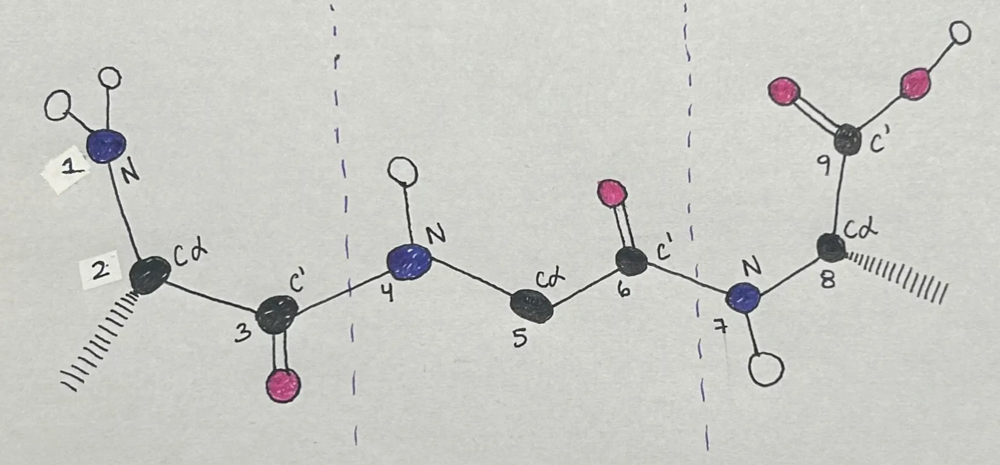

* The first residue doesn't have a conventional phi angle because there is no previous residue.
* The last residue doesn't have a conventional psi angle because theere is no following residue.
* Residues in the middle contain both phi and psi.

Therefore, a peptide must contain at least three residues to contain an interior residue with a complete phi/psi pair.



## 2.f Conformation and Molecular Energy

Not every possible phi/psi combination is equally favorable. Changing these angles changes the distances and orientations between atoms.

Some conformations:
* Allow atoms to remain comfortably separated.
* Produce favorable bond and torsion geometries.
* Have relatively low calculated molecular energy.

Other conformations:

* Force atoms too close together.
* Create steric clashes.
* Distort favorable geometries.
* Require substantially more energy.

Computational molecular mechanics can estimate these energetic differences. In this notebook, the MMFF94 force field is used to calculate approximate molecular energies. These values should be interpreted as computational estimates rather than exact experimental energies.

## Checkpoint 1

Based on the following diagram with labeled atom indices, find the correct indices that make up the phi and psi backbones for the residue in the middle (the only residue with a complete phi/psi pair).

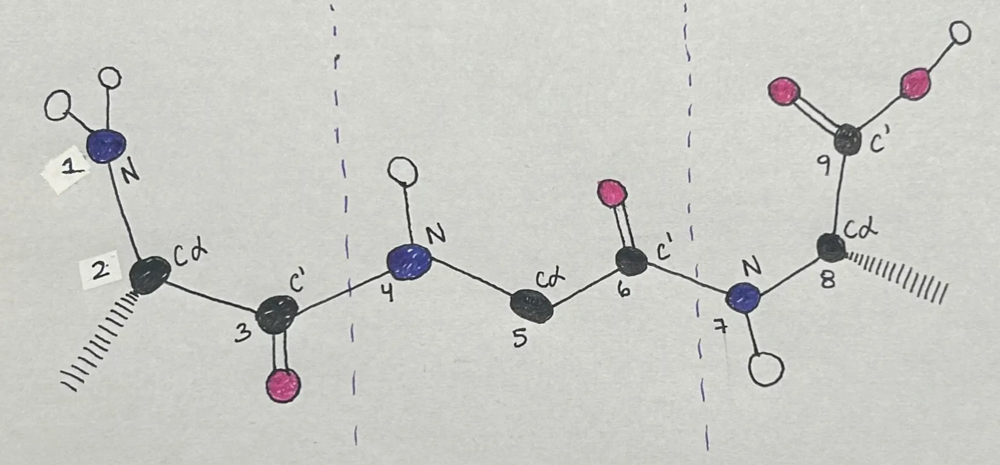



In [ ]:
# @title Cell 2.2: Checkpoint 1 Question

# CPK color scheme
element_colors = {
    "H":  "#FFFFFF", # White
    "C":  "#909090", # Grey
    "N":  "#2944cf", # Blue
    "O":  "#d60d0d", # Red
    "F":  "#37c4a9", # Teal/Green
    "Cl": "#41bf41", # Green
    "P":  "#FF8000", # Orange
    "S":  "#b5b50d", # Yellow
}

# SMILES Reference Library for amino acids
molecule_library = {
  "alanine":          "CC(C(=O)O)N",
  "arginine":         "C(CC(C(=O)O)N)CN=C(N)N",
  "asparagine":       "C(C(C(=O)O)N)C(=O)N",
  "aspartic acid":    "C(C(C(=O)O)N)C(=O)O",
  "cysteine":         "C(C(C(=O)O)N)S",
  "glutamic acid":    "C(CC(=O)O)C(C(=O)O)N",
  "glutamine":        "C(CC(=O)N)C(C(=O)O)N",
  "glycine":          "C(C(=O)O)N",
  "histidine":        "C1=C(NC=N1)CC(C(=O)O)N",
  "isoleucine":       "CCC(C)C(C(=O)O)N",
  "leucine":          "CC(C)CC(C(=O)O)N",
  "lysine":           "C(CCN)CC(C(=O)O)N",
  "methionine":       "CSCCC(C(=O)O)N",
  "phenylalanine":    "C1=CC=C(C=C1)CC(C(=O)O)N",
  "proline":          "C1CC(NC1)C(=O)O",
  "serine":           "C(C(C(=O)O)N)O",
  "threonine":        "CC(C(C(=O)O)N)O",
  "tryptophan":       "C1=CC=C2C(=C1)C(=CN2)CC(C(=O)O)N	",
  "tyrosine":         "C1=CC(=CC=C1CC(C(=O)O)N)O",
  "valine":           "CC(C)C(C(=O)O)N"

  # --- original molecules ---
  # "ethane":           "CC",
  # "propane":          "CCC",
  # "pentane":          "CCCCC",
  # "isobutane":        "CC(C)C",
  # "cyclohexane":      "C1CCCCC1",
  # "ethanol":          "CCO",
  # "acetic acid":      "CC(=O)O",
  # "acetone":          "CC(C)=O",
  # "ethylenediamine":  "NCCN",
  # "butadiene":        "C=CC=C",
  # "bipyridine":       "c2ccc(c1ccccn1)nc2",
  # "aspirin":          "CC(=O)OC1=CC=CC=C1C(=O)O",
}

# correct atom indices
correct_phi = [3, 4, 5, 6]
correct_psi = [4, 5, 6, 7]

while True:
  try:
    phi_answer = [int(x) for x in input("enter the four atom numbers that define phi (φ), separated by spaces: ").split()]
    psi_answer = [int(x) for x in input("enter the four atom numbers that define psi (ψ), separated by spaces: ").split()]

    phi_correct = phi_answer == correct_phi
    psi_correct = psi_answer == correct_psi

    if phi_correct and psi_correct:
      print("your answers for checkpoint 1 are correct!")
      break

    if not phi_correct:
      print("your phi (φ) atoms are incorrect, remember: C′(previous) - N - Cα - C′")

    if not psi_correct:
      print("your psi (ψ) atoms are incorrect, remember: N - Cα - C′ - N(next)")

  except ValueError:
    print("please enter four atom numbers separated by spaces, for example: 1 1 1 1\n")

enter the four atom numbers that define phi (φ), separated by spaces: 3 4 5 6
enter the four atom numbers that define psi (ψ), separated by spaces: 4 5 6 7
your answers for checkpoint 1 are correct!


---

# 3. Section Overview: SMILES Notation

Computational chemistry software needs a way to represent molecules as text. One of the most common formats is **SMILES** (Simplified Molecular Input Line Entry System), which encodes a molecule's atoms and connectivity using a short character string.

For example:

| Molecule | SMILES |
|---|---|
| Ethane | `CC` |
| Ethanol | `CCO` |
| Alanine | `CC(C(=O)O)N` |
| Arginine | `C(CC(C(=O)O)N)CN=C(N)N` |

Throughout the early sections of this notebook, SMILES strings are used to represent individual amino acids. You do **not** to learn the full SMILES syntax to complete this activity.

## Generating SMILES Strings

If you know the structure of a molecule but not its SMILES string, you can use an online molecular editor:

**MolView:** https://molview.org/

Instructions:

1. Open MolView in your browser.
2. Draw the molecule using the drawing tools.
3. Hover over tools, in the drop down menu, click information card. A lot of useful information about the molecule you just drew will be displayed.
4. Copy the displayed **SMILES** string. Either Canonical SMILES or Isomeric SMILES will work.
5. Paste the SMILES string into the code cells in this notebook when prompted.

For example, drawing propane produces the SMILES string:

```text
CCC
```

which can then be used directly in RDKit, a library used in this notebook:

```python
smiles = "CCC"
```

### Run the cell below, try to draw Valine (C₅H₁₁NO₂) in MolView, copy its SMILES string and paste it in the code cell you just ran then hit Enter.


## Valine 2-D Representation
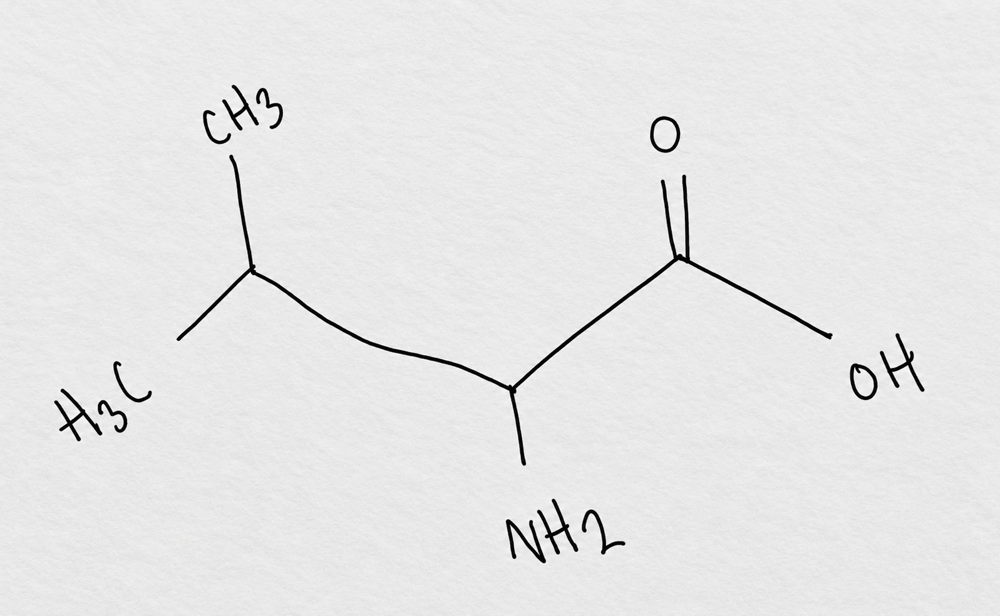

In [ ]:
#@title Cell 3.1: Please input your Valine SMILES string

# Check if 'molecule_library' is defined. If not, instruct the user to complete Checkpoint 1.
if 'molecule_library' not in globals():
    print("Error: 'molecule_library' is not defined. Please go back to Cell 2.2 and ensure Checkpoint 1 is completed successfully.")
else:
  # Prompt user to enter 'valine' and add it if correct
  while True:
      user_input = input("Please enter the SMILES string for 'valine': ")
      if user_input == "CC(C)C(C(=O)O)N":
          molecule_library["valine"] = "CC(C)C(C(=O)O)N"
          print("Valine successfully added to the library.")
          break
      else:
          print("Incorrect input. Please try again.")

  print(f"Available molecules: {', '.join(molecule_library.keys())}")

Please enter the SMILES string for 'valine': CC(C)C(C(=O)O)N
Valine successfully added to the library.
Available molecules: alanine, arginine, asparagine, aspartic acid, cysteine, glutamic acid, glutamine, glycine, histidine, isoleucine, leucine, lysine, methionine, phenylalanine, proline, serine, threonine, tryptophan, tyrosine, valine


In [ ]:
# @title Skip previous checkpoint

molecule_library["valine"] = "CC(C)C(C(=O)O)N"

---

# 4. Visualizing 2D Structures

Before building peptide structures, it is useful to examine the individual amino acids. RDKit can render these directly from SMILES — no internet connection required.

The cell below displays all available amino acids in a grid.
This is a quick sanity check: if a SMILES string is invalid, RDKit will display a blank
panel rather than raising an error.

Although all amino acids contain the same general backbone framework, their side chains vary substantially.

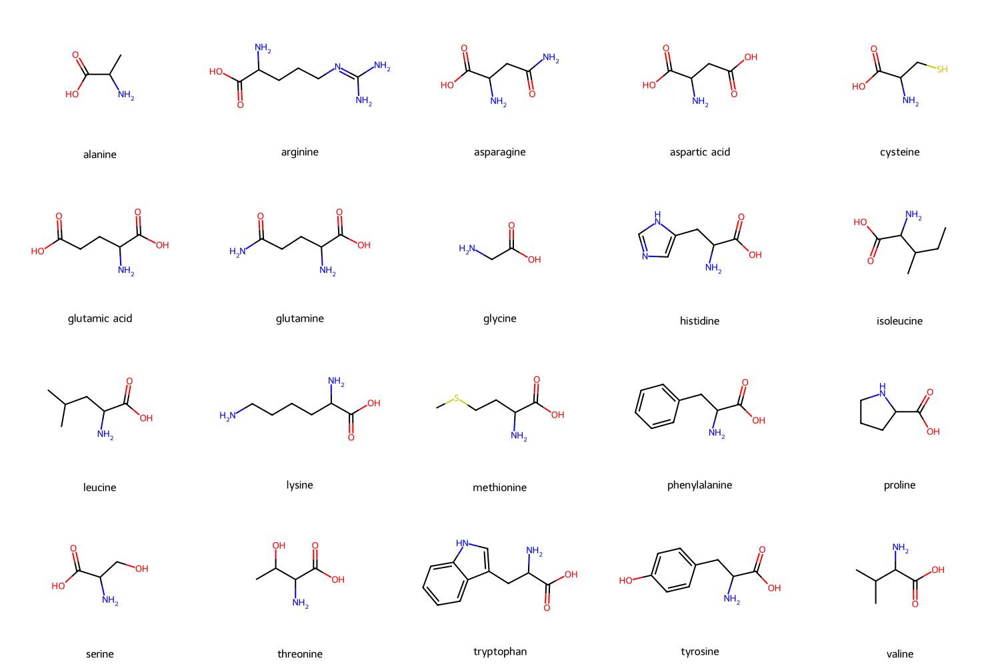

In [ ]:
#@title Cell 4.1: Show All 2D Structures of Available Amino Acids

# convert each SMILES string into an RDKit molecule
# and display the entire amino acid library as a grid
mols_2d = []
labels_2d = []

# loop through each amino acid
for name, smi in molecule_library.items():
    mol = Chem.MolFromSmiles(smi)
    if mol:
        mols_2d.append(mol)
        labels_2d.append(name)
    else:
        print(f"  Warning: invalid SMILES for '{name}': {smi}")

# display 2D version of all 20
img = Draw.MolsToGridImage(
    mols_2d,
    molsPerRow=5,
    subImgSize=(300, 250),
    legends=labels_2d
)

display(img)

<!-- **Checkpoint:** Can you identify which structures match the SMILES strings from Section 3b?
Look for the functional groups you recognized earlier. -->

---

# 5. Building a Peptide

Individual amino acids can be represented using SMILES, but longer peptide sequences are more conveniently represented using one-letter amino acid codes. This notation is commonly used in FASTA sequences. Each common amino acid has a standard one-letter abbreviation.

| Amino Acid | FASTA | | Amino Acid | FASTA |
|---|---|-|---|---|
| Alanine | A | | Leucine | L |
| Arginine | R | | Lysine | K |
| Asparagine | N | | Methionine | M |
| Aspartic Acid | D | | Phenylalanine | F |
| Cysteine | C | | Proline | P |
| Glutamine | Q | | Serine | S |
| Glutamic Acid | E | | Threonine | T |
| Glycine | G | | Tryptophan | W |
| Histidine | H | | Tyrosine | Y |
| Isoleucine | I | | Valine | V |

For example: AGS represents Alanine - Glycine - Serine in that order.

## Building a 3D Peptide

Going from a FASTA sequence to a 3D molecular model requires several steps:

1. **Embedding** — placing atoms in 3D space using distance geometry (ETKDGv3 algorithm).
2. **Optimization** — minimizing the energy with a force field (MMFF94) so bond lengths,
   angles, and torsions are chemically reasonable. The optimized model represents one possible low-energy conformation of the peptide, but shouldn't be interpreted as the only possible conformation.

We then color atoms using the standard **CPK color scheme** (named after Corey, Pauling,
and Koltun), which you may have seen on physical molecular models:

| Element | Color |
|---|---|
| H | White |
| C | Grey |
| N | Blue |
| O | Red |
| S | Yellow |
| P | Orange |
| F | Teal |
| Cl | Green |

In [ ]:
#@title Cell 5.1: Choose Your Peptide

# amino acid look-up tables
# amino acid : FATSA letter
amino_acids = {
  "alanine": "A",
  "arginine": "R",
  "asparagine": "N",
  "aspartic acid": "D",
  "cysteine": "C",
  "glutamine": "Q",
  "glutamic acid": "E",
  "glycine": "G",
  "histidine": "H",
  "isoleucine": "I",
  "leucine": "L",
  "lysine": "K",
  "methionine": "M",
  "phenylalanine": "F",
  "proline": "P",
  "serine": "S",
  "threonine": "T",
  "tryptophan": "W",
  "tyrosine": "Y",
  "valine": "V"
}

# amino acid : 3-letter code
three_letter_codes = {
  "alanine": "Ala",
  "arginine": "Arg",
  "asparagine": "Asn",
  "aspartic acid": "Asp",
  "cysteine": "Cys",
  "glutamine": "Gln",
  "glutamic acid": "Glu",
  "glycine": "Gly",
  "histidine": "His",
  "isoleucine": "Ile",
  "leucine": "Leu",
  "lysine": "Lys",
  "methionine": "Met",
  "phenylalanine": "Phe",
  "proline": "Pro",
  "serine": "Ser",
  "threonine": "Thr",
  "tryptophan": "Trp",
  "tyrosine": "Tyr",
  "valine": "Val"
}

# create dropdown options for the peptide builder
options = list(amino_acids.keys())

# display three dropdown menus so the user can build
# a short peptide one residue at a time
print("choose 3 amino acids to create a peptide of your choosing \n")
residue_1_dropdown = widgets.Dropdown(options=options, description="amino acid 1:")
residue_2_dropdown = widgets.Dropdown(options=options, description="amino acid 2:")
residue_3_dropdown = widgets.Dropdown(options=options, description="amino acid 3:")
display(residue_1_dropdown, residue_2_dropdown, residue_3_dropdown)

# stores the peptide sequence generated from the dropdown menus
sequence_input = ""


"""
converts the selected amino acids into a FASTA sequence.
this function is called automatically whenever a dropdown selection changes.
"""
def update_dropdown_sequence(change=None):
  global sequence_input
  sequence_input = ""
  for residue_dropdown in [residue_1_dropdown.value, residue_2_dropdown.value, residue_3_dropdown.value]:
    sequence_input += amino_acids[residue_dropdown]

# rebuild the sequence whenever the user changes a selection.
residue_1_dropdown.observe(update_dropdown_sequence, names="value")
residue_2_dropdown.observe(update_dropdown_sequence, names="value")
residue_3_dropdown.observe(update_dropdown_sequence, names="value")

# initialize the peptide sequence using the default selections.
update_dropdown_sequence()

choose 3 amino acids to create a peptide of your choosing 



Dropdown(description='amino acid 1:', options=('alanine', 'arginine', 'asparagine', 'aspartic acid', 'cysteine…

Dropdown(description='amino acid 2:', options=('alanine', 'arginine', 'asparagine', 'aspartic acid', 'cysteine…

Dropdown(description='amino acid 3:', options=('alanine', 'arginine', 'asparagine', 'aspartic acid', 'cysteine…

In [ ]:
import builtins
input = builtins.input        # restore the built-in input function if it was overwritten

#@title Cell 5.2: Or enter your own FASTA sequence (optional)

while True:
  fasta_string_input = input("Enter the FASTA string of the peptide you have chosen: ").upper().strip()

  # if nothing was entered, use Cell 5.1 dropdown selection
  if fasta_string_input == "":
    print(f"Using last defined sequence: {sequence_input}")
    break

  # check length
  if len(fasta_string_input) < 3:
    print("Please enter at least 3 amino acids.")
    continue

  # check each letter
  valid = True
  for letter in fasta_string_input:
    if letter not in amino_acids.values():
      print(f"'{letter}' is not a valid FASTA letter.")
      valid = False
      break

  if not valid:
    continue

  # input is valid, so update
  sequence_input = fasta_string_input
  print(f"Using custom sequence: {sequence_input}")
  break


Enter the FASTA string of the peptide you have chosen: d
Please enter at least 3 amino acids.
Enter the FASTA string of the peptide you have chosen: 
Using last defined sequence: DFDF


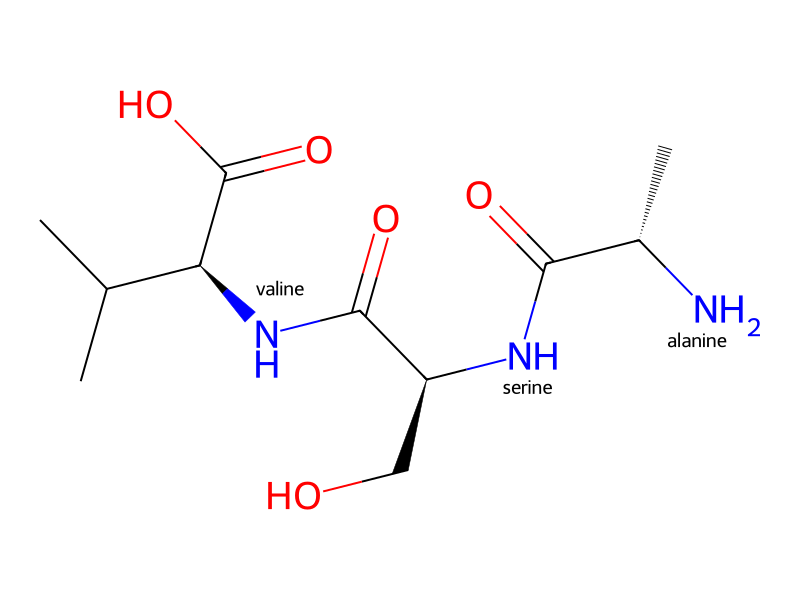

In [ ]:
# @title Cell 5.3: Generate and Display a 2D Peptide Structure

#############################
# HELPER FUNCTIONS
#############################

"""
Return True if the atom is a carbonyl carbon.
"""
def is_carbonyl(atom):
  if atom.GetSymbol() != "C":
    return False

  for bond in atom.GetBonds():
    other = bond.GetOtherAtom(atom)
    if (other.GetSymbol() == "O" and bond.GetBondType() == Chem.BondType.DOUBLE):
      return True

  return False


"""
Returns the backbone atoms (N, Cα, and carbonyl C)
for each residue in the peptide.
"""
def find_backbone(mol):
  backbone = []

  # find nitorgen (N) atoms in peptide backbone
  for n_atom in mol.GetAtoms():

    # only consider nitrogen atoms
    if n_atom.GetSymbol() != "N":
        continue
    n_idx = n_atom.GetIdx()

    # the C-alpha is the carbon atom attached to N that is not carbonyl
    ca_candidates = []
    for neighbor in n_atom.GetNeighbors():
        if neighbor.GetSymbol() == "C" and not is_carbonyl(neighbor):
            ca_candidates.append(neighbor)

    if not ca_candidates:
        continue

    # normally there should only be one C-alpha candidate
    ca_atom = ca_candidates[0]
    ca_idx = ca_atom.GetIdx()

    # find the carbonyl carbon attached to C-alpha
    carbonyl_candidates = []
    for neighbor in ca_atom.GetNeighbors():
        if is_carbonyl(neighbor):
            carbonyl_candidates.append(neighbor)

    if not carbonyl_candidates:
        continue

    c_atom = carbonyl_candidates[0]
    c_idx = c_atom.GetIdx()
    backbone.append({"N": n_idx, "CA": ca_idx, "C": c_idx})

  return backbone


"""
Determine the atoms that define each residue's
phi and psi dihedral angles.
"""
def find_dihedral_indices(backbone):
  dihedrals = {}

  for i, residue in enumerate(backbone):
    phi = None
    psi = None

    # phi: C(previous) - N - CA - C
    if i > 0:
      phi = [backbone[i - 1]["C"], residue["N"], residue["CA"], residue["C"]]

    # psi: N - CA - C - N(next)
    if i < len(backbone) - 1:
      psi = [ residue["N"], residue["CA"], residue["C"], backbone[i + 1]["N"]]

    # adds residue name, phi, and psi dihedrals starting with residue #0
    dihedrals[i] = {"phi": phi, "psi": psi}

  return dihedrals


#############################
# MAIN PROGRAM
#############################

# creates mol
mol = Chem.MolFromFASTA(sequence_input)

# identify the peptide backbone
backbone = find_backbone(mol)

# map each one-letter code to its three-letter amino acid code
fasta_to_name = {v: k for k, v in amino_acids.items()}

# label each residue at its backbone nitrogen atom
# so it can be identified in the 2D drawing.
for i, residue in enumerate(backbone):
    n_idx = residue["N"]
    amino_acid = fasta_to_name[sequence_input[i]]

    mol.GetAtomWithIdx(n_idx).SetProp(
        "atomNote",
        f"{amino_acid}"
    )

img = Draw.MolToImage(
    mol,
    size=(800, 600)
)

display(img)


In [ ]:
# @title Cell 5.4: Generate and Visualize the Peptide in 3D

# convert FASTA sequence back to amino acid names for display
selected_amino_acids = [fasta_to_name[letter] for letter in sequence_input]

# create a name using 3 letter codes
molecule_code_name = "-".join(
    three_letter_codes [aa] for aa in selected_amino_acids
)

# create peptide from FASTA sequence
mol = Chem.MolFromFASTA(sequence_input)
mol = Chem.AddHs(mol)

params = AllChem.ETKDGv3()
params.randomSeed = 42           # fixed seed → reproducible geometry
AllChem.EmbedMolecule(mol, params)
AllChem.MMFFOptimizeMolecule(mol)

conf = mol.GetConformer()

# canonical SMILES generated by rdkit
smiles = Chem.MolToSmiles(mol)

# print molecule information
print("Peptide Information")
print("-------------------")
print(f"Name:     {molecule_code_name}")
print(f"Sequence: {sequence_input}")
print(f"SMILES:   {smiles}")
print(f"Atoms:    {mol.GetNumAtoms()}")
print(f"Bonds:    {mol.GetNumBonds()}\n")

# display peptide in 3D
view = py3Dmol.view(width=600, height=400)
view.setBackgroundColor("white")
view.addModel(Chem.MolToMolBlock(mol), "mol")

# styles
for elem, color in element_colors.items():
    view.setStyle({"elem": elem}, {"stick": {"color": color, "radius": 0.1}, "sphere": {"scale": 0.25, "color": color}})

# add amino acid labels to the backbone
for i, residue in enumerate(backbone):
    n_idx = residue["N"]
    amino_acid = fasta_to_name[sequence_input[i]]
    pos = conf.GetAtomPosition(n_idx)

    view.addLabel(
        f"{i + 1}: {amino_acid}",
        {
            "position": {
                "x": pos.x,
                "y": pos.y + 1.0,
                "z": pos.z
            },
            "fontColor": "black",
            "backgroundColor": "white",
            "fontSize": 12,
            "backgroundOpacity": 0.8 })

view.zoomTo(2)
view.show()

Peptide Information
-------------------
Name:     Ala-Ser-Val
Sequence: ASV
SMILES:   [H]OC(=O)[C@@]([H])(N([H])C(=O)[C@@]([H])(N([H])C(=O)[C@@]([H])(N([H])[H])C([H])([H])[H])C([H])([H])O[H])C([H])(C([H])([H])[H])C([H])([H])[H]
Atoms:    40
Bonds:    39



3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<!-- **Explore the model:** Can you identify every atom by its color? Can you count the hydrogens?
How does the 3D structure compare to the 2D skeletal formula? -->

---

# 6. Conformational Energy Scanner

So far, the peptide has been shown as a static structure. However, peptide backbones are flexible. Rotation around the N - Cα and Cα - C' bonds allows the peptide to adopt many different conformations described by phi and psi. The conformational energy scanner systematically changes these angles and calculates how the molecular energy responds.

The scanner:


1. Identifies the middle resiude in the peptide, then finds the four atoms defining phi and the four atoms defining psi.
2. Sets the dihedral to each angle from -180 to 180 (every 1°, so 361 points total).
3. Minimizes the rest of the molecule lightly while holding the dihedral atoms fixed.
4. Records the energy in kJ/mol relative to the global minimum.
5. Plots the results.

For the sake of time, this only produces an energy graph for the phi angles and takes about a minute to fully run.

Scanning residue 1: serine
Phi atoms: [2, 5, 6, 7]
Psi atoms: [5, 6, 7, 11]

Computing phi energy profile...

Done!
  Barrier height (ΔE): 88.59 kJ/mol
  Most stable phi angle: -170°
  Least stable phi angle: 17°


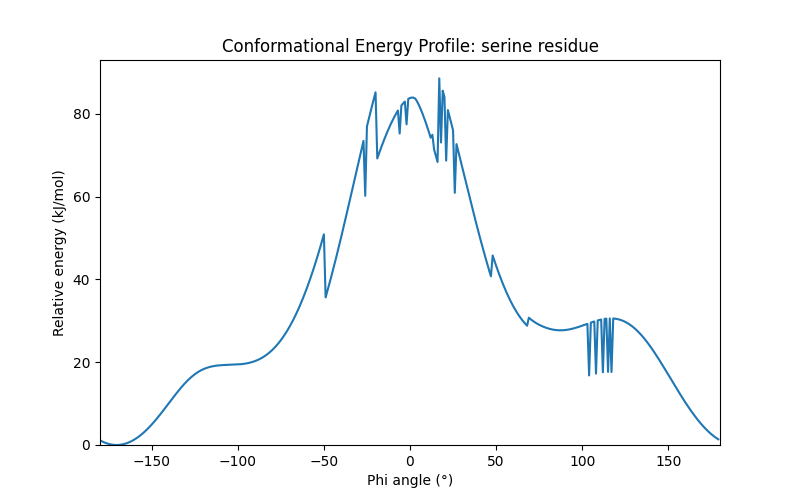

In [ ]:
# @title Cell 6.1: Energy Calculations
%matplotlib widget

dihedrals = find_dihedral_indices(backbone)

# choose an internal residue so that both phi and psi are defined
internal_indices = list(range(1, len(backbone) - 1))
residue_index = internal_indices[len(internal_indices) // 2]

phi_atoms = dihedrals[residue_index]["phi"]
psi_atoms = dihedrals[residue_index]["psi"]

if phi_atoms is None or psi_atoms is None:
    raise ValueError("A residue with both phi and psi angles is required.")

print(f"Scanning residue {residue_index}: {fasta_to_name[sequence_input[residue_index]]}")
print(f"Phi atoms: {phi_atoms}")
print(f"Psi atoms: {psi_atoms}")

# MMFF94 force-field parameters
mmff_props = AllChem.MMFFGetMoleculeProperties(mol, mmffVariant="MMFF94")

print("\nComputing phi energy profile...")

# scan phi from -180 to 180 degrees
angles = np.arange(-180, 180, 1)
phi_energies = []
psi_energies = []

for angle in angles:
    mol_tmp = Chem.Mol(mol)
    rdMolTransforms.SetDihedralDeg(mol_tmp.GetConformer(), *phi_atoms, float(angle))
    ff = AllChem.MMFFGetMoleculeForceField(mol_tmp, mmff_props)
    # Position constraints prevent the reference atoms from drifting during minimization
    for atom_idx in phi_atoms:
        ff.MMFFAddPositionConstraint(atom_idx, 0, 1e4)
    ff.Minimize(maxIts=500)
    phi_energies.append(ff.CalcEnergy() * 4.184)   # kcal/mol → kJ/mol

# convert to NumPy array
energies = np.array(phi_energies)

# set the lowest energy to 0 kJ/mol
energies = energies - energies.min()

# find important values
min_energy = energies.min()
max_energy = energies.max()
barrier_height = max_energy - min_energy

most_stable_angle = angles[np.argmin(energies)]
least_stable_angle = angles[np.argmax(energies)]

print("\nDone!")
print(f"  Barrier height (ΔE): {barrier_height:.2f} kJ/mol")
print(f"  Most stable phi angle: {most_stable_angle}°")
print(f"  Least stable phi angle: {least_stable_angle}°")

# Plot energy profile
fig, ax = plt.subplots(figsize=(8, 5))

ax.plot(angles, energies)
ax.set_xlabel("Phi angle (°)")
ax.set_ylabel("Relative energy (kJ/mol)")
ax.set_title(
    f"Conformational Energy Profile: "
    f"{fasta_to_name[sequence_input[residue_index]]} residue"
)

ax.set_xlim(-180, 180)
ax.set_ylim(bottom=0)

plt.show()

---
## Checkpoint 2

Examine the calculated energy profile. Although the exact shape of the energy curve depends on the residue and its surrounding peptide environment, some regions of φ space are commonly less favorable than others.

For many peptide residues, which φ-angle region tends to be especially unfavorable (requires a lot of energy to maintain it's conformation)?

- -150°
- -50
- 0
- 100

In [ ]:
#@title Cell 6.2: Checkpoint 2

while True:
    answer2 = int(input("Which phi angle region tends to be especially unfavorable? (-150, -50, 0, 100) "))
    if answer2 == 0:
        print("Your answer for checkpoint 2 is correct!"
          "\n\nFor many residues, φ near 0° causes atoms to get too close together, "
          "\nmaking the conformation less favorable and higher in energy.")
        break
    elif answer2 == -150 or answer2 == -50 or answer2 == 100:
      print("Your answer is wrong. Think about which value corresponds to the highest energy on the graph.")
    else:
      print("Invalid input. Please only enter one of the options above.")


Which phi angle region tends to be especially unfavorable? (-150, -50, 0, 100) 0
Your answer for checkpoint 2 is correct!

For many residues, φ near 0° causes atoms to get too close together, 
making the conformation less favorable and higher in energy.


---

# 7. Interactive Visualization

The next visualization combines several ideas introduced earlier in the notebook.

The interactive explorer allows you to:
* Choose a residue.
* Identify the atoms defining phi and psi.
* Change phi and psi using sliders.
* Watch the 3D peptide update.
* Track the selected conformation on an energy surface.
* Compare low and high energy regions that may produce steric clashes.

### 7.a Selecting a Residue

The dropdown contains only residues that possess both phi and psi angles. Terminal residues are excluded because they lack one of the neighboring atoms required to define a complete pair.

### 7.b Highlighting Modes

The highlight controls allow different backbone atoms to be emphasized.

* Current phi/psi : highlights the atoms involved in both dihedral angles for the residue.
* Current phi : highlights only the atoms defining phi.
* Current psi : highlights only the atoms defining psi.
* All dihedral atoms : highlights all backbone atoms involved in peptide dihedral angles throughout the molecule.

These modes are intended to make the connection between the angles and physical molecular structure easier to see and helps to emphasize which atoms are rotating.

### 7.c Exploring phi and psi

The phi and psi sliders range from approximately -180 to 180 degrees. Moving either slider updates the molecular structure. The selected angle values are saved for each residue. Even if you switch residues, the previously selected angles will remain for that residue.

This feature becomes useful later on when attempting to construct secondary structures.

### 7.d Conformational Energy Surface

The left plot represents the calculated molecular energy over sampled phi/psi combinations. Phi is shown on one horizontal axis, psi on the other, and molecular energy on the vertical axis. The moving marker identifies the currently selected phi/psi combination.

Different residues and surrounding peptide environments may produce different energy landscapes.

### 7.e Steric Accessibility Map

Not every phi/psi combination produces a geometrically reasonable conformation. Some angle combinations force nonbonded atoms too close together. This is called a **steric clash**.

The notebook evaluates the sampled conformations and separates them based on geometric accessibility.

* Green : No detected steric clash and relatively favorable energy.
* Yellow : No detected clash but moderate calculated energy.
* Red : No detected clash but high calculated energy.
* Gray : At least one steric clash is detected.


### 7.f Runtime Note !!

This section evaluates many phi/psi combinations. Just like the energy calculation in the previous code cell, this also requires multiple separate conformations for each selected residue.

The interactive explorer may therefore take one minute or longer to load. Longer peptides generally require more computational work and will take more time to run the more amino acids there are.

### 7.g Secondary Structure Challenge

Later in the notebook, you will learn characteristic phi/psi values associated with common secondary structures. After completing that section, return here and try assigning similar angles to several consecutive residues.

Because each residue retains its selected angles, you can gradually construct a repeating backbone geometry and watch the three-dimensional structure change.

<!--
**What to look for:**
- Where are the minima? Are they all the same depth (symmetric molecule) or different (asymmetric)?
- Where are the maxima? What does the 3D structure look like at those points?
- How large is the rotational barrier compared to thermal energy at room temperature
  (~2.5 kJ/mol)? Can the molecule rotate freely?  -->

In [ ]:
# @title Cell 7.1: Interactive Conformational Energy Surface and Ramachandran Explorer
%matplotlib widget


#############################
# RESIDUE HELPERS
#############################

"""
returns phi and psi bonds for the selected residue.
"""
def get_residue_dihedral_atoms(dihedrals, residue_index, code=None):
  residue_dihedrals = dihedrals[residue_index]
  if code == 1: # phi only
    phi_bonds = residue_dihedrals["phi"]
    return phi_bonds
  elif code == 2: # psi only
    psi_bonds = residue_dihedrals["psi"]
    return psi_bonds
  else:
    phi_bonds = residue_dihedrals["phi"]
    psi_bonds = residue_dihedrals["psi"]
  return phi_bonds, psi_bonds


"""
returns all atoms involved in any phi or psi dihedral.
"""
def get_peptide_dihedral_atoms(dihedrals):
  all_atoms = set()

  for residue_dihedrals in dihedrals.values():
    if residue_dihedrals["phi"] is not None:
      all_atoms.update(residue_dihedrals["phi"])
    if residue_dihedrals["psi"] is not None:
      all_atoms.update(residue_dihedrals["psi"])

  return list(all_atoms)


"""
sets the dihedral angles for the selected residue based on the input
"""
def set_residue_dihedral_angles(conf, phi_bonds=None, psi_bonds=None, phi_angle=None, psi_angle=None):
  if phi_bonds is not None and phi_angle is not None:
    try:
      rdMolTransforms.SetDihedralDeg(conf, *phi_bonds, float(phi_angle))
    except Exception as e:
      print(f"Error setting dihedral ({phi_bonds}): {e}", file=sys.stderr)

  if psi_bonds is not None and psi_angle is not None:
    try:
      rdMolTransforms.SetDihedralDeg(conf, *psi_bonds, float(psi_angle))
    except Exception as e:
      print(f"Error setting dihedral ({psi_bonds}): {e}", file=sys.stderr)


#############################
# VISUALIZATION HELPERS
#############################

"""
highlights atoms based on the user selected highlight mode
"""
def highlight_dihedral_atoms(view, phi_bonds, psi_bonds, dihedrals, highlight_mode_user):
  for e,c in element_colors.items():
    view.setStyle({"elem":e},{"stick":{"color":c,"radius":0.1},"sphere":{"scale":0.25,"color":c}})

  phi_color = "#7F77DD"
  psi_color = "#1D9E75"
  combined_color = blend_hex_colors(phi_color, psi_color)
  all_color = "#FFFF00"

  all_dihedral_atoms = get_peptide_dihedral_atoms(dihedrals)
  if highlight_mode_user == "all dihedral atoms":
    view.setStyle({"index": (all_dihedral_atoms)}, {"stick": {"color": all_color, "radius": 0.1}, "sphere": {"scale": 0.25, "color": all_color}})

  elif highlight_mode_user == "current phi":
    view.setStyle({"index": phi_bonds}, {"stick": {"color": phi_color, "radius": 0.1}, "sphere": {"scale": 0.25, "color": phi_color}})

  elif highlight_mode_user == "current psi":
    view.setStyle({"index": psi_bonds}, {"stick": {"color": psi_color, "radius": 0.1}, "sphere": {"scale": 0.25, "color": psi_color}})

  else:   # only phi/psi, the default value
    view.setStyle({"index": phi_bonds[0]}, {"stick": {"color": phi_color, "radius": 0.1}, "sphere": {"scale": 0.25, "color": phi_color}})
    view.setStyle({"index": phi_bonds[1:]}, {"stick": {"color": combined_color, "radius": 0.1}, "sphere": {"scale": 0.25, "color": combined_color}})
    view.setStyle({"index": psi_bonds[3]}, {"stick": {"color": psi_color, "radius": 0.1}, "sphere": {"scale": 0.25, "color": psi_color}})


"""
labels the atoms involved in the selected dihedral
"""
def label_dihedral_atoms(view, mol_current, phi_bonds, psi_bonds):
  # label the atom indices involved in the selected dihedral
  view.removeAllLabels()

  conf = mol_current.GetConformer()

  for atom in mol_current.GetAtoms():
    if atom.GetIdx() in phi_bonds or atom.GetIdx() in psi_bonds:            # includes only backbone atoms
      idx = atom.GetIdx()
      pos = conf.GetAtomPosition(idx)
      view.addLabel(str(idx), {
          "position": {"x": pos.x, "y": pos.y + 0.5, "z": pos.z},
          "fontColor": "black",
          "backgroundColor": "white",
          "fontSize": 12,
          "backgroundOpacity": 0.8
      })


#############################
# ANGLE HELPERS
#############################

"""
initializes angle dictionary and sets intial phi/psi values to -180
"""
def initialize_saved_angles(dihedrals, mol_current):
  saved_angles = {}
  initial_angle = -180

  for residue_number, residue_dihedrals in dihedrals.items():
    saved_angles[residue_number] = {"phi":initial_angle, "psi":initial_angle}
    conf = mol_current.GetConformer()

    set_residue_dihedral_angles(conf, phi_bonds=residue_dihedrals["phi"], psi_bonds=residue_dihedrals["psi"], phi_angle=initial_angle, psi_angle=initial_angle)

  return saved_angles


"""
returns the energy value for the current phi/psi values
"""
def find_z_val_energy(phi_range, current_phi, psi_range, current_psi, energy_grid):
  phi_idx = (np.abs(phi_range - current_phi)).argmin()
  psi_idx = (np.abs(psi_range - current_psi)).argmin()
  z_val = energy_grid[psi_idx, phi_idx]  # meshgrid order is (psi, phi)

  return z_val


"""
returns True or False depending if the peptide has a clash free or clash heavy zone
"""
def has_steric_clash(mol, cutoff=1.2):
  conf = mol.GetConformer()

  for i in range(mol.GetNumAtoms()):
    pos_i = conf.GetAtomPosition(i)
    for j in range(i + 1, mol.GetNumAtoms()):

      # ignore bonded atoms
      if mol.GetBondBetweenAtoms(i, j):
        continue

      pos_j = conf.GetAtomPosition(j)
      distance = pos_i.Distance(pos_j)

      if distance < cutoff:
        return True

  return False


#############################
# CONFORMATIONAL SCAN
#############################

"""
runs a conformational scan by varying the selected phi and psi angles
"""
def run_conformational_scan(dihedrals, residue_value_user=1, highlight_mode_user="current phi/psi"):
  global mol_current
  phi_bonds, psi_bonds = get_residue_dihedral_atoms(dihedrals, residue_value_user)

  current_phi = saved_angles[residue_value_user]["phi"]
  current_psi = saved_angles[residue_value_user]["psi"]

  # add view
  view = py3Dmol.view(width=800, height=510)
  view.setBackgroundColor("white")

  view.removeAllModels()
  view.addModel(Chem.MolToMolBlock(mol_current), "mol")

  # highlight and label dihedrals
  highlight_dihedral_atoms(view, phi_bonds, psi_bonds, dihedrals, highlight_mode_user)
  label_dihedral_atoms(view, mol_current, phi_bonds, psi_bonds)

  # energy
  phi_range = np.linspace(-180, 180, 37)
  psi_range = np.linspace(-180, 180, 37)
  phi_grid, psi_grid = np.meshgrid(phi_range, psi_range)
  energy_grid = np.zeros_like(phi_grid)

  allowed = np.zeros_like(phi_grid, dtype=bool)

  # 0 = clash
  # 1 = low energy
  # 2 = medium energy
  # 3 = high energy
  classification = np.zeros_like(phi_grid, dtype=int)

  for i in range(phi_grid.shape[0]):
    for j in range(phi_grid.shape[1]):
      mol_tmp = Chem.Mol(mol_current)
      conf = mol_tmp.GetConformer()

      set_residue_dihedral_angles(conf, phi_bonds=phi_bonds, psi_bonds=psi_bonds, phi_angle=phi_grid[i, j], psi_angle=psi_grid[i, j])

      props = AllChem.MMFFGetMoleculeProperties(mol_tmp)
      ff = AllChem.MMFFGetMoleculeForceField(mol_tmp, props)
      ff.Minimize(maxIts=50)

      allowed[i,j] = not has_steric_clash(mol_tmp)
      energy_grid[i, j] = ff.CalcEnergy() * 4.184             # kJ/mol


  # "RAMACHANDRAN LIKE PLOT"
  valid_energy = energy_grid[allowed]

  emin = np.min(valid_energy)
  emax = np.max(valid_energy)

  green_limit = emin + 10
  yellow_limit = emin + 25

  classification = np.zeros_like(phi_grid)
  for i in range(phi_grid.shape[0]):
    for j in range(phi_grid.shape[1]):
      if not allowed[i,j]:
        classification[i,j] = 0
      elif energy_grid[i,j] < green_limit:
        classification[i,j] = 1
      elif energy_grid[i,j] < yellow_limit:
        classification[i,j] = 2
      else:
        classification[i,j] = 3



  # ---- UI layout ----
  mol_out = widgets.Output(layout=widgets.Layout(width='50%'))

  with mol_out:
    display(view)

  # clear figures before creating a new one
  plt.close("all")

  # create the 3D energy surface
  fig = plt.figure(figsize=(10, 5))
  ax = fig.add_subplot(121, projection="3d")
  ax2 = fig.add_subplot(122)

  surf = ax.plot_surface(phi_grid, psi_grid, energy_grid, cmap="viridis", edgecolor='none', alpha=0.6)

  z_val = find_z_val_energy(phi_range, current_phi, psi_range, current_psi, energy_grid)
  energy_text = ax.text2D(0.05, 0.95, f"Energy: {z_val:.2f} kJ/mol", transform=ax.transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor="gray"))
  dot, = ax.plot([current_phi], [current_psi], [z_val], 'ro', markersize=8)

  ax.set_xlabel("phi ($\\phi$)")
  ax.set_ylabel("psi ($\\psi$)")
  ax.set_zlabel("Energy")
  ax.set_title("Energy Surface")
  fig.colorbar(surf, shrink=0.5, aspect=10)

  min_energy = np.min(energy_grid)
  cutoff = min_energy + 15  # adjustable
  allowed_mask = energy_grid <= cutoff

  # ax2.scatter(phi_grid[allowed_mask], psi_grid[allowed_mask],
  #             color='green', s=10, alpha=0.5, label='Allowed')
  # ax2.scatter(phi_grid[~allowed_mask], psi_grid[~allowed_mask],
              # color='lightgray', s=10, alpha=0.5, label='Disallowed')

  ax2.scatter(phi_grid[classification==0], psi_grid[classification==0], color="lightgray", s=10, label="Steric clash")
  ax2.scatter(phi_grid[classification==1], psi_grid[classification==1], color="green", s=10, label="Low energy")
  ax2.scatter(phi_grid[classification==2], psi_grid[classification==2], color="gold", s=10, label="Moderate energy")
  ax2.scatter(phi_grid[classification==3], psi_grid[classification==3], color="red", s=10, label="High energy")
  ax2.legend()

  # rama = ax2.scatter(phi_grid.flatten(), psi_grid.flatten(), c=energy_grid.flatten(), cmap="viridis", s=25)

  rama_dot = ax2.scatter(current_phi, current_psi, c="red", s=50)

  ax2.set_xlabel("phi ($\\phi$)")
  ax2.set_ylabel("psi ($\\psi$)")
  ax2.set_xlim(-180, 180)
  ax2.set_ylim(-180, 180)
  ax2.set_title("Ramachandran Plot")

  plot_out = widgets.Output(layout=widgets.Layout(width='50%'))
  with plot_out:
      plt.show()

  # ---- interactive sliders ----
  phi_slider=widgets.IntSlider(value=round(current_phi),min=-180,max=180,step=1,description="phi (φ)",continuous_update=True,layout=widgets.Layout(width="98%"))
  psi_slider=widgets.IntSlider(value=round(current_psi),min=-180,max=180,step=1,description="psi (ψ)",continuous_update=True,layout=widgets.Layout(width="98%"))


  def update_slider_and_view(change):
    nonlocal current_phi, current_psi

    # update only the angle controlled by the slider that changed
    if change["owner"] == phi_slider:
        current_phi = change["new"]
    elif change["owner"] == psi_slider:
        current_psi = change["new"]

    saved_angles[residue_value_user]["phi"] = current_phi
    saved_angles[residue_value_user]["psi"] = current_psi

    conf = mol_current.GetConformer()
    set_residue_dihedral_angles(conf, phi_bonds=phi_bonds, psi_bonds=psi_bonds, phi_angle=current_phi, psi_angle=current_psi)

    view.removeAllModels()
    view.addModel(Chem.MolToMolBlock(mol_current),"mol")

    # highlight and label dihedrals
    highlight_dihedral_atoms(view, phi_bonds, psi_bonds, dihedrals, highlight_mode_user)
    label_dihedral_atoms(view, mol_current, phi_bonds, psi_bonds)

    z_val = find_z_val_energy(phi_range, current_phi, psi_range, current_psi, energy_grid)
    energy_text.set_text(f"Energy: {z_val:.2f} kJ/mol")
    dot.set_data([current_phi], [current_psi])
    dot.set_3d_properties([z_val])

    rama_dot.set_offsets([[current_phi, current_psi]])

    # update view
    fig.canvas.draw_idle()
    view.update()

  phi_slider.observe(update_slider_and_view, names="value")
  psi_slider.observe(update_slider_and_view, names="value")

  return widgets.VBox([phi_slider,psi_slider,widgets.HBox([mol_out, plot_out])])


#############################
# MAIN PROGRAM
#############################

backbone = find_backbone(mol)
dihedrals = find_dihedral_indices(backbone)

mol_current = Chem.Mol(mol)

# init saved angles
saved_angles = initialize_saved_angles(dihedrals, mol_current)

# ----- choosing a residue -----
residue_dropdown = widgets.Dropdown()
residue_options = []

fasta_to_name = {v:k for k, v in amino_acids.items()}

for residue_number, info in dihedrals.items():
  if info["phi"] is not None and info["psi"] is not None:
    amino_acid = fasta_to_name[sequence_input[residue_number]]
    residue_options.append((f"Residue {residue_number}: {amino_acid.capitalize()}", residue_number))

residue_dropdown.options = residue_options

# ----- choosing a highlighting mode for dihedral atoms -----
highlight_mode = widgets.ToggleButtons(
  options=[
      "current phi/psi",
      "current phi",
      "current psi",
      "all dihedral atoms"
  ],
  description="highlight mode:",
  disabled=False,
  button_style="",
  tooltips=["current phi/psi", "current phi", "current psi", "all dihedral atoms"]
)
highlight_mode.value = "current phi/psi"

# ---- displaying output and widgets ----
conformational_scanner_output = widgets.Output()

def update_scanner(change=None):
  with conformational_scanner_output:
    conformational_scanner_output.clear_output(wait=True)
    display(run_conformational_scan(dihedrals, residue_value_user=residue_dropdown.value, highlight_mode_user=highlight_mode.value))

residue_dropdown.observe(update_scanner,names="value")
highlight_mode.observe(update_scanner,names="value")

# display widgets
display(residue_dropdown)
display(highlight_mode)
display(conformational_scanner_output)

update_scanner()


Dropdown(options=(('Residue 1: Serine', 1),), value=1)

ToggleButtons(description='highlight mode:', options=('current phi/psi', 'current phi', 'current psi', 'all di…

Output()

---

# 8. Ramachandran Plot

The conformational map in section 7 is calculated from a specific residue in a peptide.

A ramachandran plot provides different information. Instead of predicting favorable and unfavorable regions for that residue, it plots phi/psi combinations that are actually observed in peptide and protein structures.

Each point represents the phi and psi values of a residue. When data from many residues are combined, clusters start to appear in specific phi and psi regions. These clusters correspond to backbone conformations and secondary structures that occur frequently in real proteins.


Not all amino acids have the same conformational freedom.

**Glycine** (orange) : has the smallest possible side chain (single hyrodgen atom). Since it has very little steric bulk, glycine can occupy regions of phi/psi space that are inaccessible to many other residues.

**Proline** (purple) : has a cyclic side chain that connects back to the backbone nitrogen atom which heavily restricts backbone rotation. As a result, it occupies a much smaller range of space.

Other residues can also differ because larger or more complex side chains create different steric environments.

Optional: Run the next cell to generate a peptide containing a user-selected number of randomly selected amino acids. This provides more residues for the ramachandran analysis, so the plot becomes more populated and clusters start to appear. Alternatively, skip this cell and continue using the peptide created earlier. You may also return to the peptide creation section and enter a longer sequence manually.

<br>

**Runtime warning** : very long peptides require additonal computation. Once the sequence approaches or exceeds approximately 50 amino acids, it takes a substantial amount of time to generate the ramachandran plot, and may not generate at all.

In [ ]:
import random
import builtins
input = builtins.input        # restore the built-in input function if it was overwritten
# @title Cell 8.1: Generate a Random Peptide (optional)

length_of_peptide  = int(input("Enter new length of peptide (optional): "))

amino_acid_letters = "ACDEFGHIKLMNPQRSTVWY"
random.seed(42)
sequence = "".join(random.choices(amino_acid_letters, k=length_of_peptide))

print("current sequence =", sequence)

Enter new length of peptide (optional): 6
current sequence = PAGFRQ


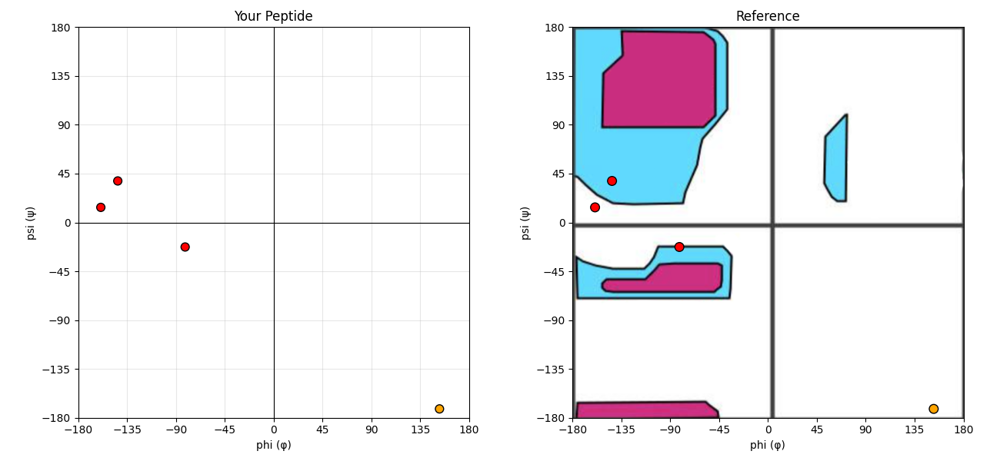

In [ ]:
# @title Cell 8.2: Natural Ramachandran Plot

#############################
# HELPER FUNCTIONS
#############################

"""
returns the dihedral angle for four atom indices.
"""
def get_dihedral_angle(mol, atom_indices):
  conf = mol.GetConformer()
  return rdMolTransforms.GetDihedralDeg(conf, *atom_indices)


"""
returns the phi and psi angle pairs for each residue.
"""
def get_ramachandran_angles(mol, dihedrals):
  angles = []

  for residue_number, residue_dihedrals in dihedrals.items():

    phi_bonds = residue_dihedrals["phi"]
    psi_bonds = residue_dihedrals["psi"]

    # both angles are needed to create a point
    if phi_bonds is None or psi_bonds is None:
      continue

    phi = get_dihedral_angle(mol, phi_bonds)
    psi = get_dihedral_angle(mol, psi_bonds)

    angles.append({
        "residue": residue_number,
        "phi": phi,
        "psi": psi
    })

  return angles


"""
plots the phi and psi angles for each residue.
"""
def plot_ramachandran_comparison(mol, dihedrals):
  angles = get_ramachandran_angles(mol, dihedrals)

  phi_values = [angle["phi"] for angle in angles]
  psi_values = [angle["psi"] for angle in angles]

  plt.close("all")

  fig, (ax1, ax2) = plt.subplots(
    1,
    2,
    figsize=(13,6)
  )

  colors = []

  for angle in angles:
    aa = sequence[angle["residue"]]

    if aa == "G":
      colors.append("orange")
    elif aa == "P":
      colors.append("purple")
    else:
      colors.append("red")

  # plot created using USER'S peptide
  ax1.scatter(phi_values, psi_values, c=colors, s=60, edgecolor="black")

  ax1.set_xlim(-180,180)
  ax1.set_ylim(-180,180)

  ax1.set_xticks(np.arange(-180,181,45))
  ax1.set_yticks(np.arange(-180,181,45))

  ax1.set_xlabel("phi (φ)")
  ax1.set_ylabel("psi (ψ)")
  ax1.set_title("Your Peptide")

  ax1.axhline(0,color="black",linewidth=0.8)
  ax1.axvline(0,color="black",linewidth=0.8)

  ax1.set_aspect("equal")
  ax1.grid(alpha=0.3)


  # REFERENCE PLOT
  reference = plt.imread("ramachandran_reference.png")

  ax2.imshow(reference, extent=[-180,180,-180,180], aspect="equal")

  # overlay your peptide
  ax2.scatter(phi_values, psi_values, color=colors, edgecolor="black", s=70)

  ax2.set_xlim(-180,180)
  ax2.set_ylim(-180,180)

  ax2.set_xticks(np.arange(-180,181,45))
  ax2.set_yticks(np.arange(-180,181,45))

  ax2.set_xlabel("phi (φ)")
  ax2.set_ylabel("psi (ψ)")
  ax2.set_title("Reference")

  ax2.set_aspect("equal")

  plt.tight_layout()
  plt.show()


#############################
# MAIN PROGRAM
#############################

# create molecule, embed, and optimize it
mol = Chem.MolFromFASTA(sequence)
mol = Chem.AddHs(mol)

params = AllChem.ETKDGv3()
params.randomSeed = 42
params.useRandomCoords = True

AllChem.EmbedMolecule(mol, params)
AllChem.MMFFOptimizeMolecule(mol)

# find backbone and dihedrals and create plot
backbone = find_backbone(mol)
dihedral_indices = find_dihedral_indices(backbone)
plot_ramachandran_comparison(mol, dihedral_indices)

---

# 9. Secondary Structures

Phi and psi angles are not only useful for describing individual residue conformations, but also secondary structures. When similar combinations repeat across several consecutive residues, recognizable secondary structures can form.

Two of the most common are the alpha helix and beta sheet.

A right handed alpha helix commonly contains backbone angles near phi = -57 degrees, psi = -47 degrees. This structure looks like a spiral.

A beta sheet commonly has values near phi = -139, psi = 135. This structure looks like a peptide spread or drawn out to it's longest length.

Feel free to check out common secondary structures as well as play around with angles of your choosing.

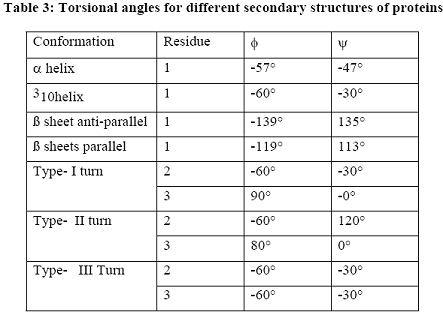

In [ ]:
# @title Cell 9.1: Explore Common Secondary Structure Angles (optional)

# print(  f"The 2 most common secondary structures: "
#         f"\nalpha helix: \n\tphi = -57 \n\tpsi = -47"
#         f"\nbeta sheet: \n\tphi = -139 \n\tpsi = 135")

while True:
  phi_angle_input = int(input("Enter phi angle: "))
  psi_angle_input = int(input("Enter psi angle: "))
  if (phi_angle_input >= -180 and phi_angle_input <= 180) and (psi_angle_input >= -180 and psi_angle_input <= 180):
    break
  else:
    print("Please make sure the angle value(s) are between -180 and 180 degrees !!")


Enter phi angle: -139
Enter psi angle: 135


In [ ]:
# @title Cell 9.2: Assign the Same φ/ψ Values to the Peptide

# if user did not specify angles,
# defaults to alpha helix angles --> phi = -57, psi = -47
try:
  phi_angle_input
  psi_angle_input
except NameError:
  phi_angle_input = -57
  psi_angle_input = -47


def set_all_angles(mol, conf, dihedrals, phi_angle, psi_angle):

  mol_tmp = Chem.Mol(mol)
  conf_tmp = mol_tmp.GetConformer()

  for residue_number, info in dihedrals.items():
    phi_bonds, psi_bonds = get_residue_dihedral_atoms(dihedrals, residue_number)
    set_residue_dihedral_angles(conf_tmp, phi_bonds, psi_bonds, phi_angle, psi_angle)

  props = AllChem.MMFFGetMoleculeProperties(mol_tmp, mmffVariant="MMFF94")

  # minimize the structure while keeping the selected dihedral atoms fixed
  ff = AllChem.MMFFGetMoleculeForceField(mol_tmp, props)

  for info in dihedrals.values():
      atoms = []

      if info["phi"] is not None:
          atoms.extend(info["phi"])
      if info["psi"] is not None:
          atoms.extend(info["psi"])
      for atom in set(atoms):
          ff.MMFFAddPositionConstraint(atom, 0, 1e4)

  ff.Minimize(maxIts=500)
  return mol_tmp


def set_peptide_dihedral_angles(mol, phi, psi):

  params = AllChem.ETKDGv3()
  params.randomSeed = 42           # fixed seed → reproducible geometry
  params.maxIterations = 1000
  AllChem.EmbedMolecule(mol, params)
  conf = mol.GetConformer()

  backbone = find_backbone(mol)
  dihedrals = find_dihedral_indices(backbone)

  mol_tmp = set_all_angles(mol, conf, dihedrals, phi, psi)

  # ---- create the view ----
  view = py3Dmol.view(width=800, height=510)
  view.setBackgroundColor("white")

  view.removeAllModels()
  view.addModel(Chem.MolToMolBlock(mol_tmp), "mol")

  # apply default element colors
  for e, c in element_colors.items():
      view.setStyle({"elem": e}, {"stick": {"color": c, "radius": 0.1}, "sphere": {"scale": 0.25, "color": c}})

  display(view)

sequence = "GGGGGGGGGGGG"
# sequence = "AAAAAAAAAAAA"
mol = Chem.MolFromFASTA(sequence)
mol = Chem.AddHs(mol)


set_peptide_dihedral_angles(mol, phi_angle_input, psi_angle_input)

3Dmol.js failed to load for some reason. Please check your browser console for error messages.